<a href="https://colab.research.google.com/github/Kiarashmo/Stroke-Patient-Motor-Imagery-Classification-System-by-Utilizing-Transfer-Learning/blob/main/Stroke_a_to_z.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies

In [ ]:
!pip install mne
!pip install torcheeg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.1/161.1 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.2/299.2 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 230.8/230.8 kB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 729.2/729.2 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.1/71.1 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.7/55.7 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 18.6 MB/s eta 0:00:00
  Created wheel for torcheeg: filename=torcheeg-1.0.11-py3-none-any.whl size

#Imports

In [ ]:
import numpy as np
import torcheeg
import mne
import scipy
import scipy.io
import matplotlib.pyplot as plt

# Paths

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
strokeDataset_path = '/content/drive/MyDrive/NMA2023_DL/Stroke_Dataset'
stroke_raw_data_path = f'{strokeDataset_path}/edffile/'
stroke_raw_data_path_mat = f'{strokeDataset_path}/code/sourcedata/'

processed_data_path = f'{strokeDataset_path}/custom'
processed_data_path_mat = f'{strokeDataset_path}/custom_mat'

# Check data

In [ ]:
subject_num = 1
path = f'{stroke_raw_data_path}/sub-01/eeg/sub-{subject_num:02}_task-motor-imagery_eeg.edf'
raw = mne.io.read_raw_edf(path, preload=True)

Extracting EDF parameters from /content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/edffile/sub-01/eeg/sub-01_task-motor-imagery_eeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 159999  =      0.000 ...   319.998 secs...


<ipython-input-69-fd922428ac0e>:3: RuntimeWarning: Physical range is not defined in following channels:
CPz
  raw = mne.io.read_raw_edf(path, preload=True)


In [ ]:
raw.get_data().shape

(31, 160000)

In [ ]:
raw.ch_names

['FP1',
 'FP2',
 'Fz',
 'F3',
 'F4',
 'F7',
 'F8',
 'FCz',
 'FC3',
 'FC4',
 'FT7',
 'FT8',
 'Cz',
 'C3',
 'C4',
 'T3',
 'T4',
 'CPz',
 'CP3',
 'CP4',
 'TP7',
 'TP8',
 'Pz',
 'P3',
 'P4',
 'T5',
 'T6',
 'Oz',
 'O1',
 'O2',
 'HEOL',
 'HEOR',
 '']

In [ ]:
raw.describe()

<RawEDF | sub-01_task-motor-imagery_eeg.edf, 33 x 160000 (320.0 s), ~40.3 MB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  FP1   EEG   µV      -206.33      -4.60       2.78      10.37     154.52
 1  FP2   EEG   µV      -143.38      -3.70       2.61       9.56      95.93
 2  Fz    EEG   µV       -60.93      -3.68       0.44       4.40      52.55
 3  F3    EEG   µV       -68.90      -3.60       0.61       4.67      64.09
 4  F4    EEG   µV       -74.02      -3.50       0.51       4.37      52.77
 5  F7    EEG   µV      -109.28      -4.11       1.17       6.43      87.58
 6  F8    EEG   µV       -96.90      -4.26       0.57       5.25      63.33
 7  FCz   EEG   µV       -52.17      -2.74       0.10       2.90      44.46
 8  FC3   EEG   µV       -77.35      -3.08       0.34       3.64      76.96
 9  FC4   EEG   µV       -59.80      -3.03       0.13       3.23      50.60
10  FT7   EEG   µV       -75.11      -3.99       0.25       4.32      64.

In [ ]:
raw.set_channel_types({
    'HEOL': 'eog',
    'HEOR': 'eog'
})

raw.drop_channels(['', 'CPz'])

<RawEDF | sub-01_task-motor-imagery_eeg.edf, 31 x 160000 (320.0 s), ~37.9 MB, data loaded>

In [ ]:
raw.describe()

<RawEDF | sub-01_task-motor-imagery_eeg.edf, 31 x 160000 (320.0 s), ~37.9 MB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  FP1   EEG   µV      -206.33      -4.60       2.78      10.37     154.52
 1  FP2   EEG   µV      -143.38      -3.70       2.61       9.56      95.93
 2  Fz    EEG   µV       -60.93      -3.68       0.44       4.40      52.55
 3  F3    EEG   µV       -68.90      -3.60       0.61       4.67      64.09
 4  F4    EEG   µV       -74.02      -3.50       0.51       4.37      52.77
 5  F7    EEG   µV      -109.28      -4.11       1.17       6.43      87.58
 6  F8    EEG   µV       -96.90      -4.26       0.57       5.25      63.33
 7  FCz   EEG   µV       -52.17      -2.74       0.10       2.90      44.46
 8  FC3   EEG   µV       -77.35      -3.08       0.34       3.64      76.96
 9  FC4   EEG   µV       -59.80      -3.03       0.13       3.23      50.60
10  FT7   EEG   µV       -75.11      -3.99       0.25       4.32      64.

In [ ]:
montage_file = "/content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/task-motor-imagery_electrodes-unit-m.tsv"
s_montage = mne.channels.read_custom_montage(montage_file)
raw.set_montage(s_montage)

<ipython-input-74-f407c7f60013>:3: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(s_montage)
<ipython-input-74-f407c7f60013>:3: RuntimeWarning: Not setting position of 1 eog channel found in montage:
['HEOL']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw.set_montage(s_montage)


<RawEDF | sub-01_task-motor-imagery_eeg.edf, 31 x 160000 (320.0 s), ~37.9 MB, data loaded>

In [ ]:
epochs = mne.make_fixed_length_epochs(raw, duration=4000/500, preload=True)
epochs.resample(160)
ica.fit(epochs)
d = epochs.get_data()
d.shape

Not setting metadata
40 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 40 events and 4000 original time points ...
0 bad epochs dropped
Fitting ICA to data using 29 channels (please be patient, this may take a while)
Selecting by number: 15 components
Fitting ICA took 6.0s.


(40, 31, 1280)

(40, 31, 4000)

### Plot

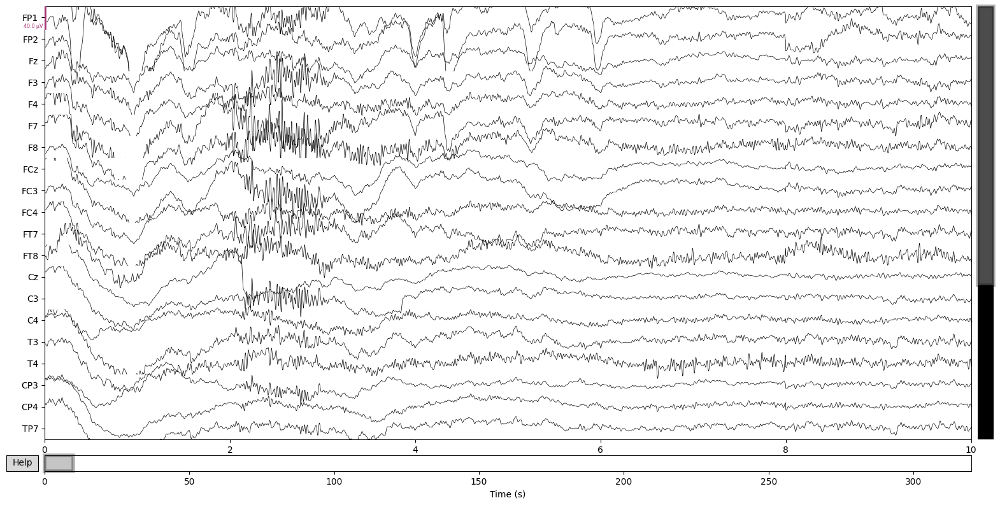

In [ ]:
mne.set_config('MNE_BROWSE_RAW_SIZE','16,8')
raw.plot()
print()

### PSD

Effective window size : 4.096 (s)


<ipython-input-76-b51cde6a2519>:1: RuntimeWarning: in version 1.5, the default behavior of Spectrum.plot() will change so that bad channels will be shown by default. To keep the old default behavior (and silence this warning), explicitly pass `picks='data', exclude='bads'`.
  raw.compute_psd().plot()


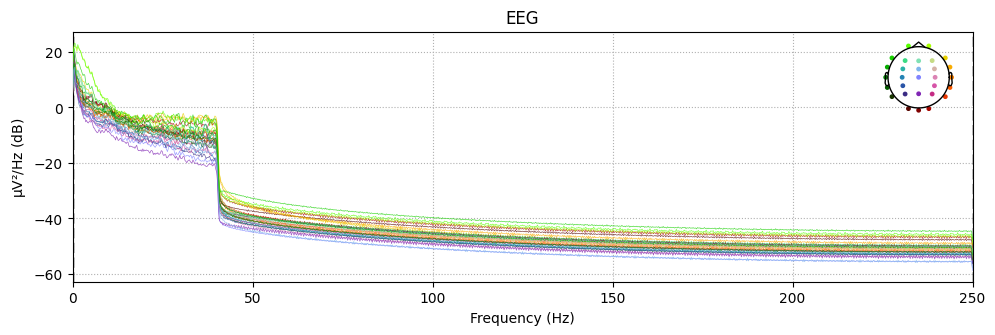

In [ ]:
raw.compute_psd().plot()
print()

Effective window size : 4.096 (s)


<ipython-input-77-fece76b81e2b>:1: RuntimeWarning: in version 1.5, the default behavior of Spectrum.plot() will change so that bad channels will be shown by default. To keep the old default behavior (and silence this warning), explicitly pass `picks='data', exclude='bads'`.
  raw.compute_psd(fmin=0, fmax=40).plot()


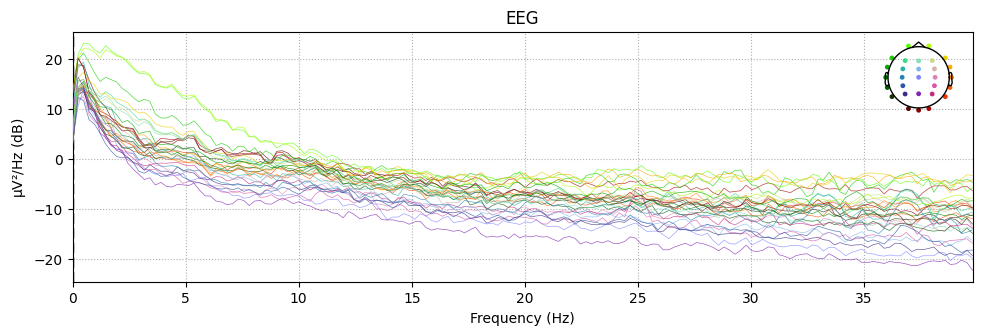

In [ ]:
raw.compute_psd(fmin=0, fmax=40).plot()
print()

Effective window size : 4.096 (s)


<ipython-input-78-4c847ce50dac>:1: RuntimeWarning: in version 1.5, the default behavior of Spectrum.plot() will change so that bad channels will be shown by default. To keep the old default behavior (and silence this warning), explicitly pass `picks='data', exclude='bads'`.
  raw.compute_psd(fmin=0, fmax=5).plot()


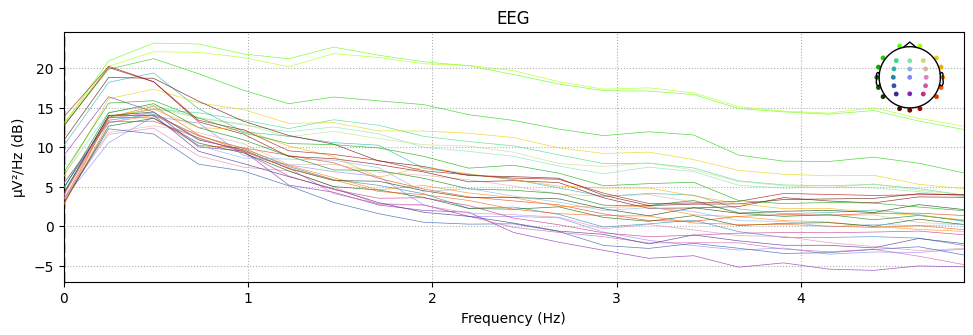

In [ ]:
raw.compute_psd(fmin=0, fmax=5).plot()
print()

Effective window size : 4.096 (s)


<ipython-input-79-fbd80012fb4d>:1: RuntimeWarning: in version 1.5, the default behavior of Spectrum.plot() will change so that bad channels will be shown by default. To keep the old default behavior (and silence this warning), explicitly pass `picks='data', exclude='bads'`.
  raw.compute_psd(fmin=0.1, fmax=5).plot()


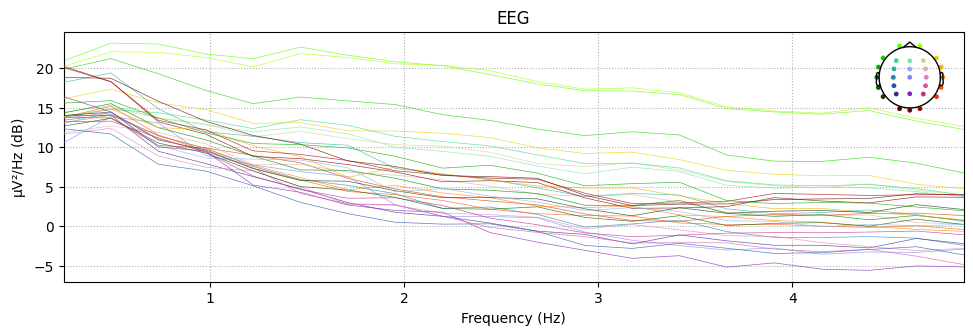

In [ ]:
raw.compute_psd(fmin=0.1, fmax=5).plot()
print()

Effective window size : 4.096 (s)


<ipython-input-80-1b4e295dbd86>:1: RuntimeWarning: in version 1.5, the default behavior of Spectrum.plot() will change so that bad channels will be shown by default. To keep the old default behavior (and silence this warning), explicitly pass `picks='data', exclude='bads'`.
  raw.compute_psd(fmin=0.1, fmax=40).plot()


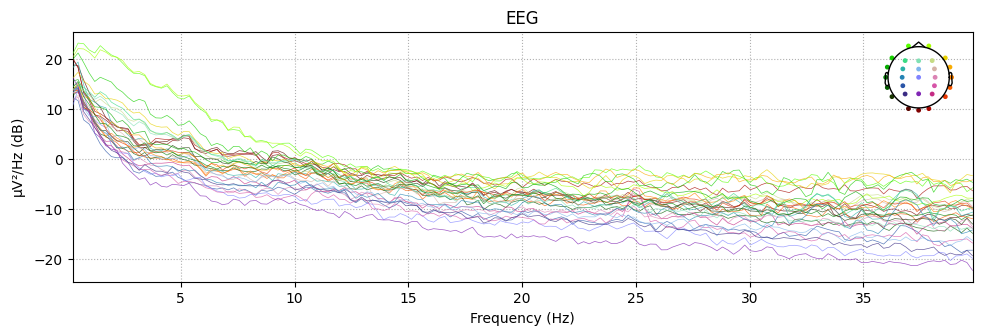

In [ ]:
raw.compute_psd(fmin=0.1, fmax=40).plot()
print()

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
Effective window size : 4.096 (s)


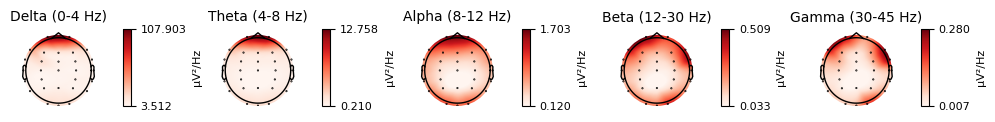

In [ ]:
raw.plot_psd_topomap()
print()

### Filter

In [ ]:
sFreq = 500
filtered_raw = raw.copy()
filtered_raw.filter(l_freq=0.5, h_freq=30)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


<RawEDF | sub-01_task-motor-imagery_eeg.edf, 31 x 160000 (320.0 s), ~37.9 MB, data loaded>

In [ ]:
filtered_raw.describe()

<RawEDF | sub-01_task-motor-imagery_eeg.edf, 31 x 160000 (320.0 s), ~37.9 MB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  FP1   EEG   µV      -193.54      -4.60       2.56      10.11     127.29
 1  FP2   EEG   µV      -139.66      -3.53       2.53       9.49      78.31
 2  Fz    EEG   µV       -57.55      -3.50       0.41       4.24      49.75
 3  F3    EEG   µV       -62.98      -3.47       0.54       4.51      47.14
 4  F4    EEG   µV       -66.54      -3.33       0.55       4.31      37.11
 5  F7    EEG   µV      -102.82      -3.99       1.06       6.10      84.96
 6  F8    EEG   µV       -85.09      -4.04       0.65       5.10      50.48
 7  FCz   EEG   µV       -47.09      -2.59       0.17       2.82      40.88
 8  FC3   EEG   µV       -72.57      -2.97       0.27       3.51      67.80
 9  FC4   EEG   µV       -55.99      -2.82       0.22       3.14      33.86
10  FT7   EEG   µV       -65.58      -3.83       0.20       4.13      37.

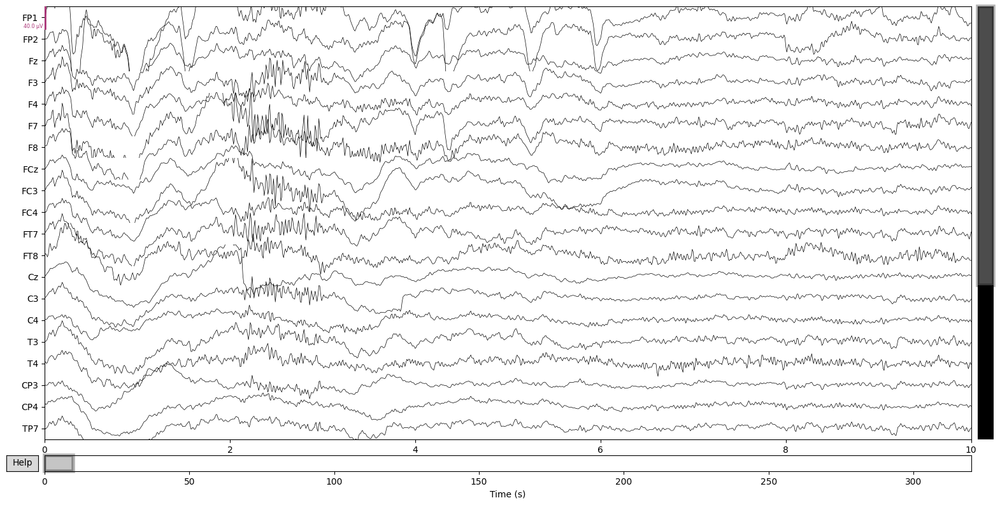

In [ ]:
filtered_raw.plot()
print()

Effective window size : 4.096 (s)


<ipython-input-97-b51cde6a2519>:1: RuntimeWarning: in version 1.5, the default behavior of Spectrum.plot() will change so that bad channels will be shown by default. To keep the old default behavior (and silence this warning), explicitly pass `picks='data', exclude='bads'`.
  raw.compute_psd().plot()


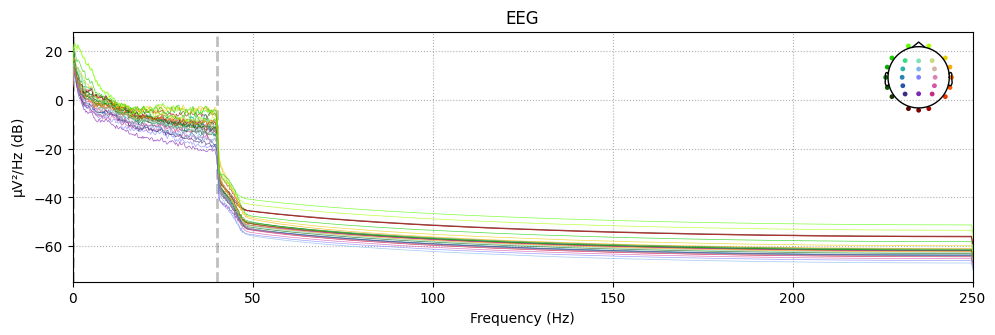

In [ ]:
raw.compute_psd().plot()
print()

### Resample

In [ ]:
freq = 160
resampled_raw = filtered_raw.copy()
resampled_raw = resampled_raw.resample(freq, npad='auto')
resampled_raw.info

<Info | 8 non-empty values
 bads: []
 ch_names: FP1, FP2, Fz, F3, F4, F7, F8, FCz, FC3, FC4, FT7, FT8, Cz, C3, ...
 chs: 29 EEG, 2 EOG
 custom_ref_applied: False
 dig: 32 items (3 Cardinal, 29 EEG)
 highpass: 0.5 Hz
 lowpass: 30.0 Hz
 meas_date: 2022-12-01 18:58:12 UTC
 nchan: 31
 projs: []
 sfreq: 160.0 Hz
>

In [ ]:
resampled_raw.describe()
print()

<RawEDF | sub-01_task-motor-imagery_eeg.edf, 31 x 51200 (320.0 s), ~12.2 MB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  FP1   EEG   µV      -192.88      -4.58       2.57      10.12     127.04
 1  FP2   EEG   µV      -139.72      -3.54       2.55       9.47      78.28
 2  Fz    EEG   µV       -57.20      -3.50       0.41       4.23      49.79
 3  F3    EEG   µV       -62.98      -3.47       0.54       4.50      46.32
 4  F4    EEG   µV       -66.29      -3.34       0.57       4.30      37.16
 5  F7    EEG   µV      -102.81      -3.98       1.06       6.10      84.46
 6  F8    EEG   µV       -84.97      -4.05       0.64       5.10      50.02
 7  FCz   EEG   µV       -46.97      -2.59       0.16       2.82      40.85
 8  FC3   EEG   µV       -72.57      -2.98       0.28       3.51      67.68
 9  FC4   EEG   µV       -55.96      -2.82       0.23       3.14      33.22
10  FT7   EEG   µV       -65.49      -3.84       0.20       4.12      35.6

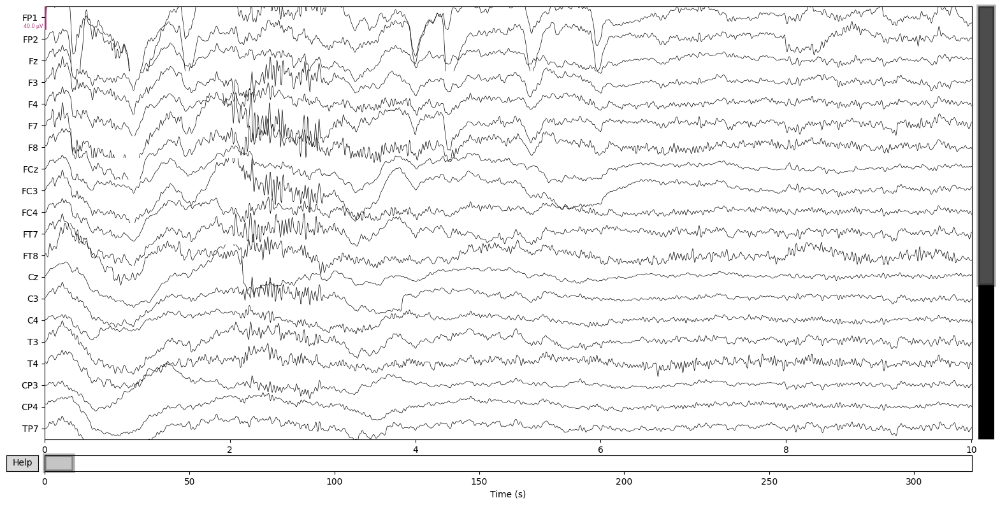

In [ ]:
resampled_raw.plot()
print()

### Referencing

In [ ]:
reference_raw = resampled_raw.copy()
# reference_raw.set_eeg_reference(['Cz'])
reference_raw.set_eeg_reference(ref_channels = 'average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEDF | sub-01_task-motor-imagery_eeg.edf, 31 x 51200 (320.0 s), ~12.2 MB, data loaded>

In [ ]:
reference_raw.describe()
print()

<RawEDF | sub-01_task-motor-imagery_eeg.edf, 31 x 51200 (320.0 s), ~12.2 MB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  FP1   EEG   µV      -139.90      -3.87       2.24       8.66     110.46
 1  FP2   EEG   µV      -113.16      -2.63       2.18       7.79      68.62
 2  Fz    EEG   µV       -25.54      -2.81       0.09       2.99      44.15
 3  F3    EEG   µV       -39.21      -2.64       0.27       3.04      34.53
 4  F4    EEG   µV       -30.46      -2.44       0.22       2.74      30.22
 5  F7    EEG   µV      -116.62      -2.89       0.66       4.30      62.52
 6  F8    EEG   µV       -62.20      -2.91       0.29       3.33      45.77
 7  FCz   EEG   µV       -34.43      -2.39      -0.00       2.43      32.72
 8  FC3   EEG   µV       -42.52      -2.09       0.08       2.16      52.02
 9  FC4   EEG   µV       -25.47      -1.99      -0.05       1.90      21.93
10  FT7   EEG   µV       -37.09      -2.40       0.04       2.49      32.2

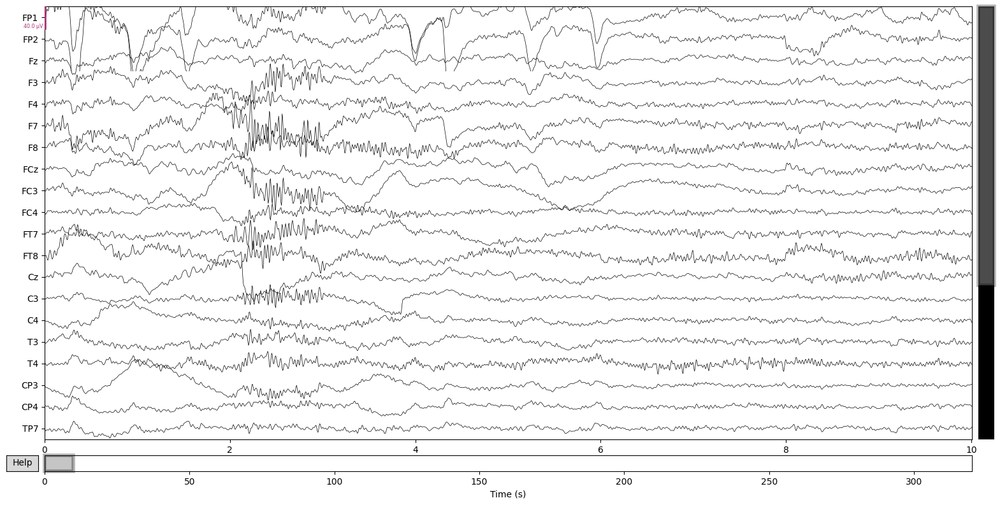

In [ ]:
reference_raw.plot()
print()

### ICA

In [ ]:
# play around with this number to get components
# that seem to represent the actual brain activations well
num_components = 20
ica = mne.preprocessing.ICA(n_components=num_components, method='fastica')
ica.fit(reference_raw)

Fitting ICA to data using 29 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 4.0s.


Method,fastica
Fit,45 iterations on raw data (51200 samples)
ICA components,20
Available PCA components,29
Channel types,eeg
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=22, n_times=51200
    Range : 0 ... 51199 =      0.000 ...   319.994 secs
Ready.


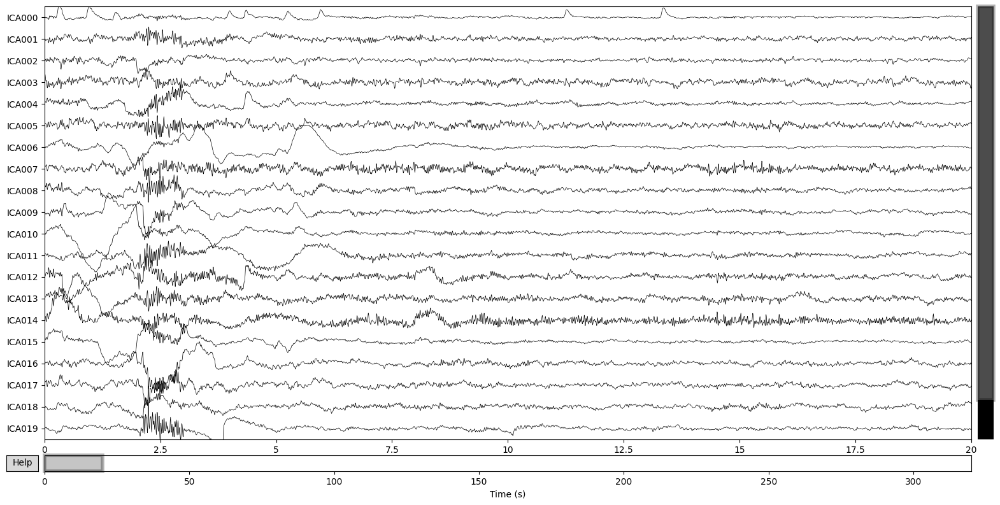

In [ ]:
ica.plot_sources(reference_raw)
print()

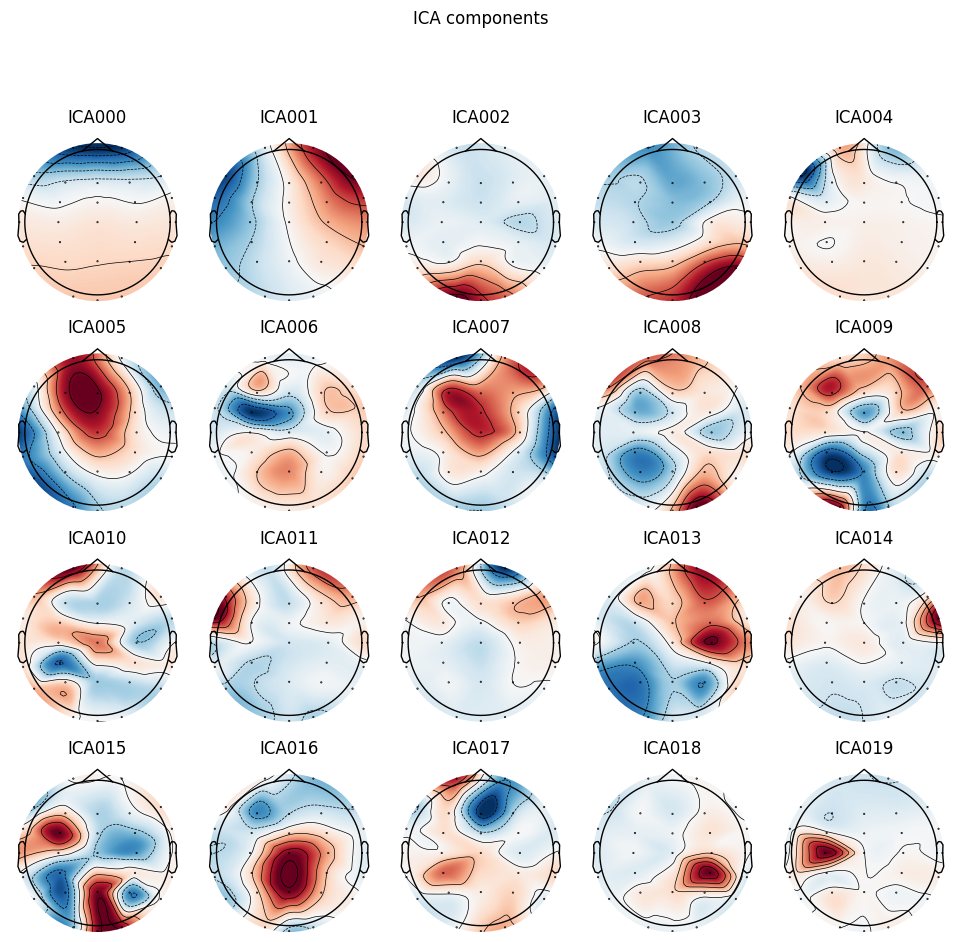

In [ ]:
ica.plot_components()
print()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated


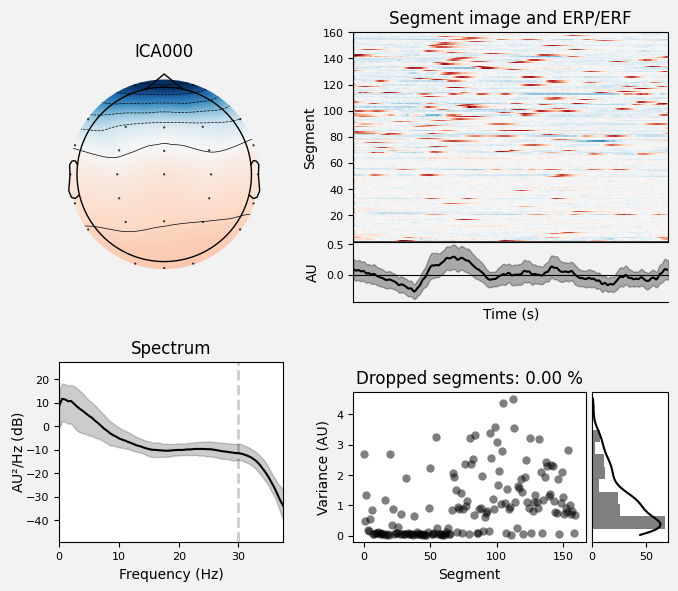

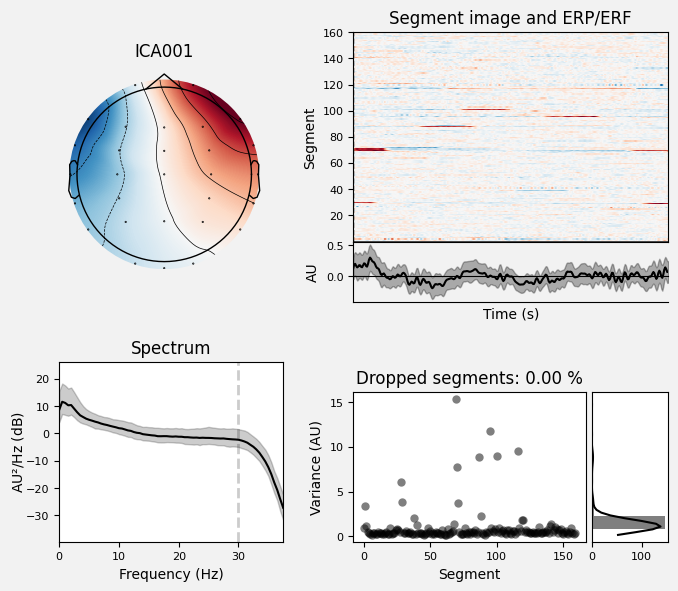

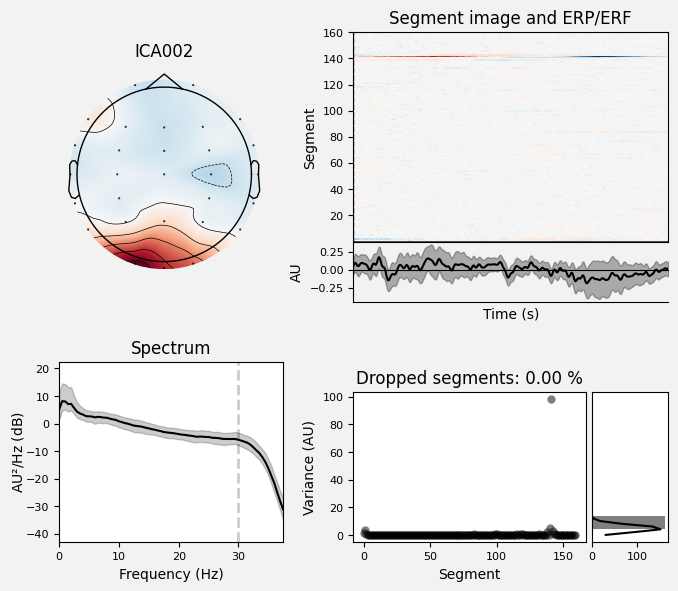

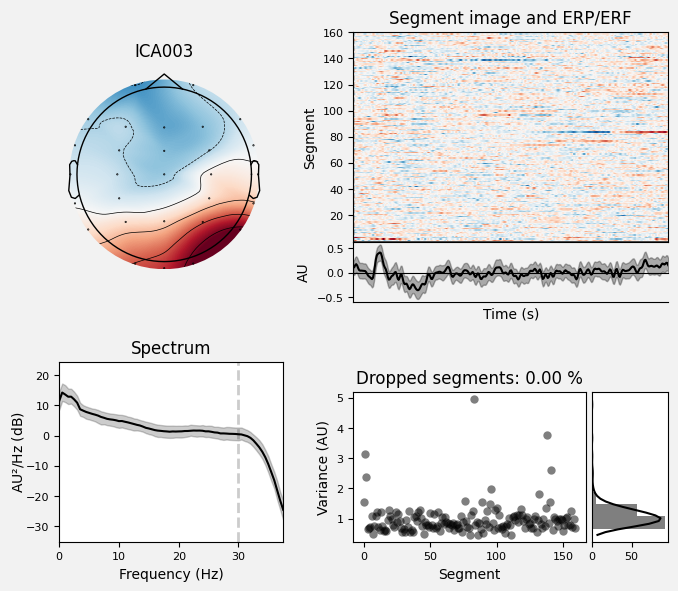

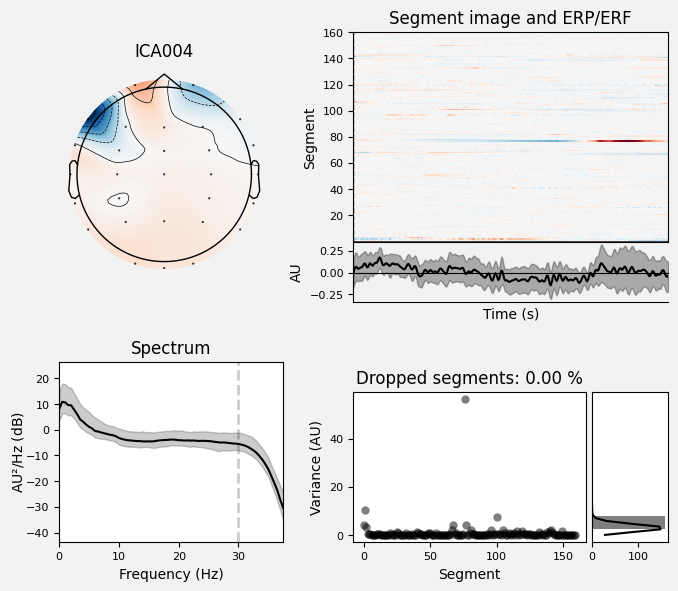

In [ ]:
ica.plot_properties(reference_raw, picks=[0, 1, 2, 3, 4])
print()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated


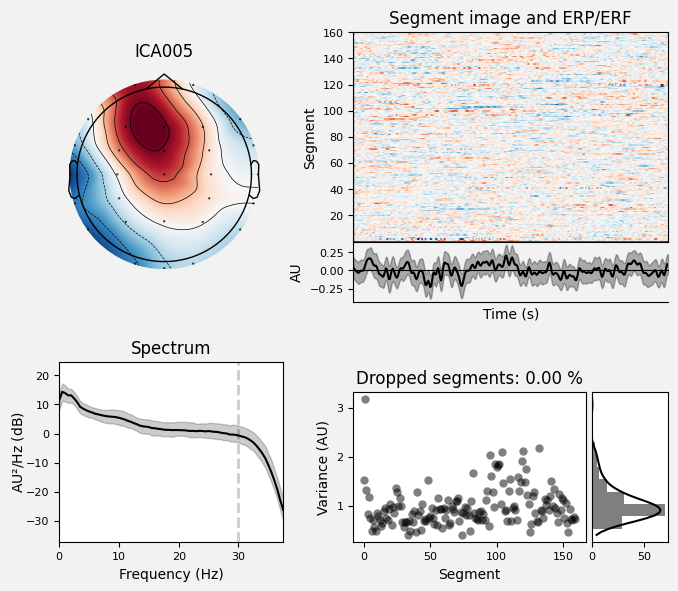

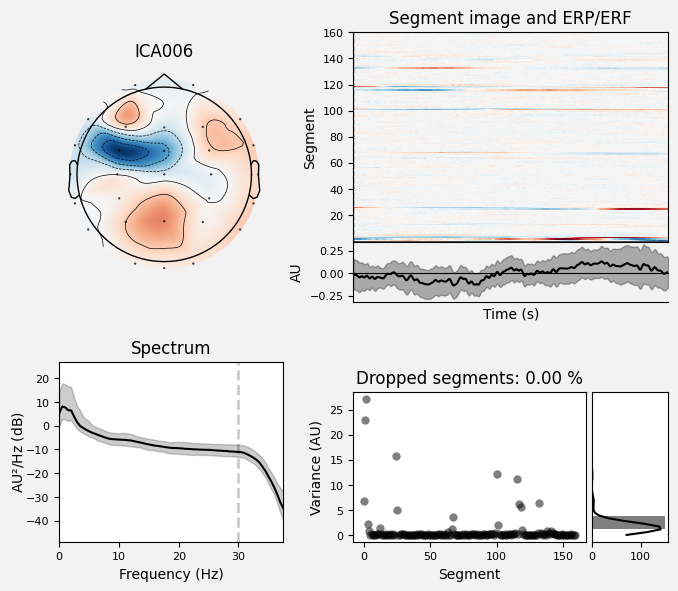

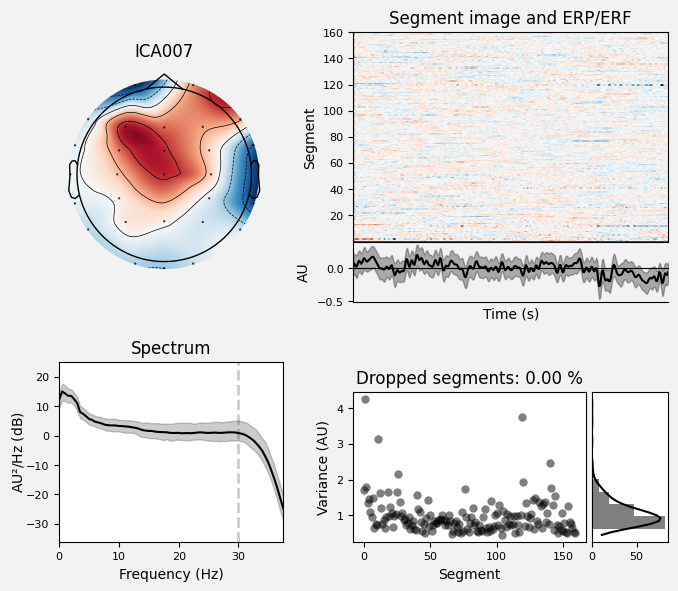

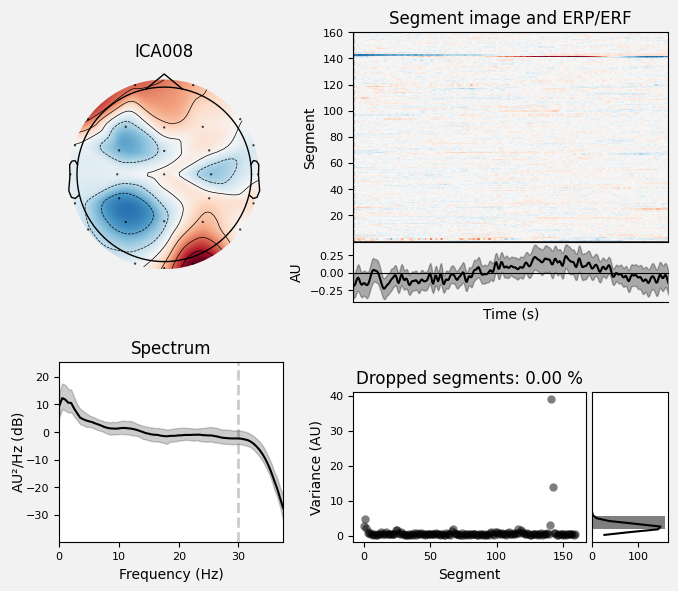

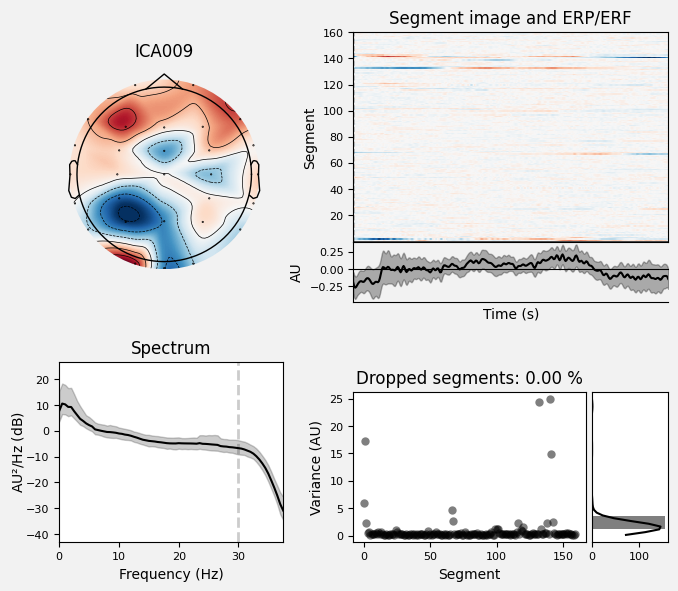

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
ica.plot_properties(reference_raw, picks=[5, 6, 7, 8, 9])

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated


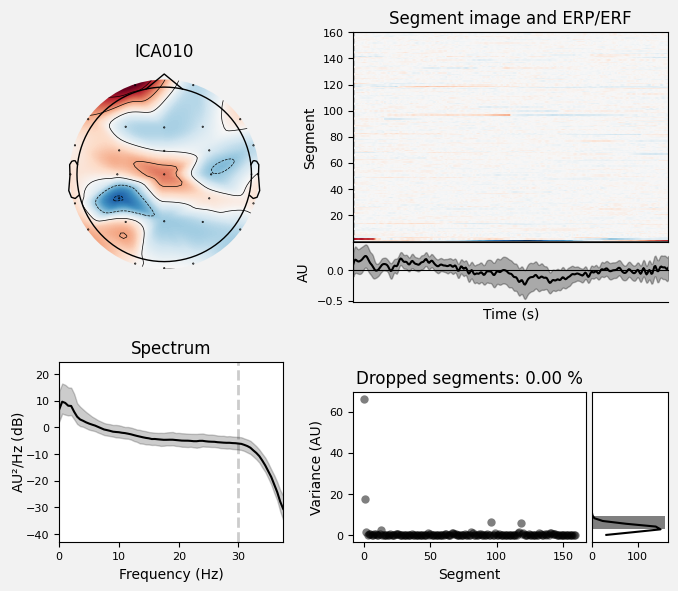

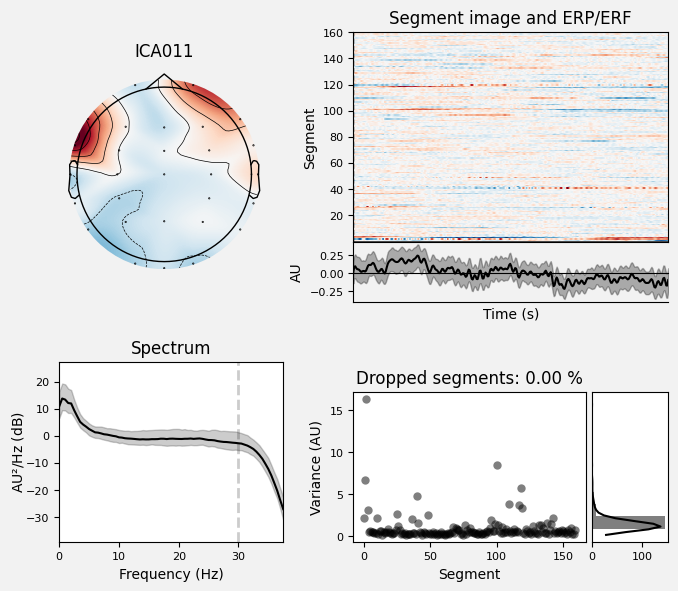

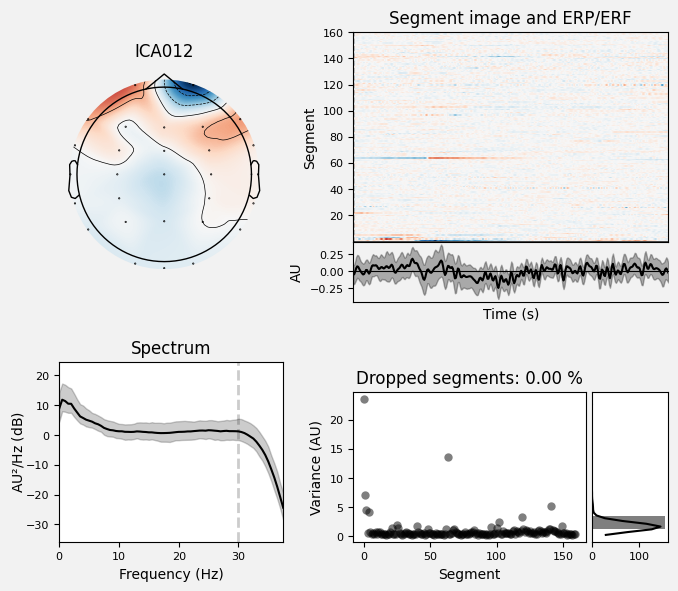

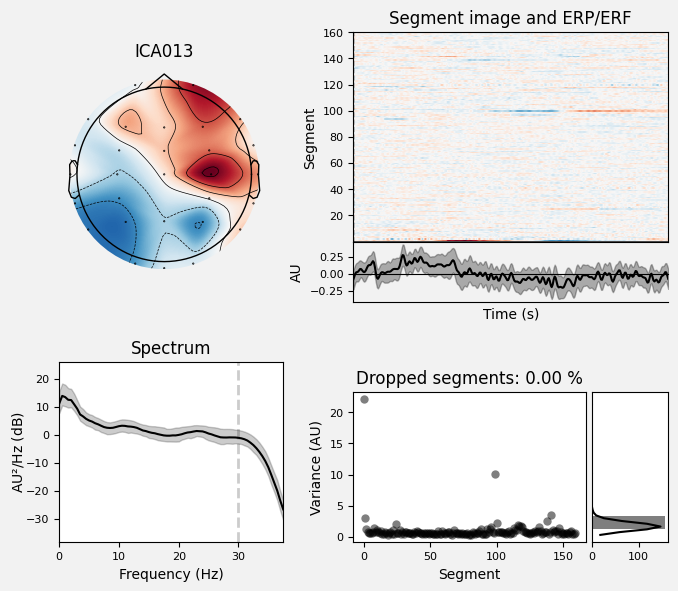

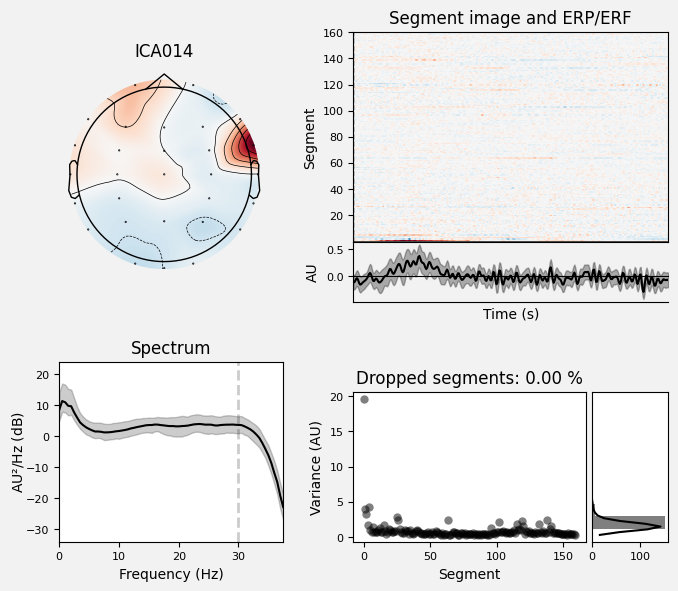

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
ica.plot_properties(reference_raw, picks=[10, 11, 12, 13, 14])

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated


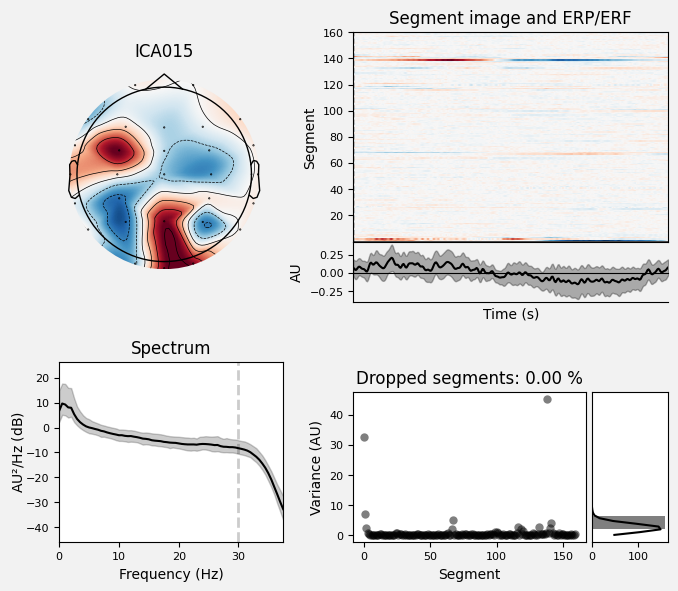

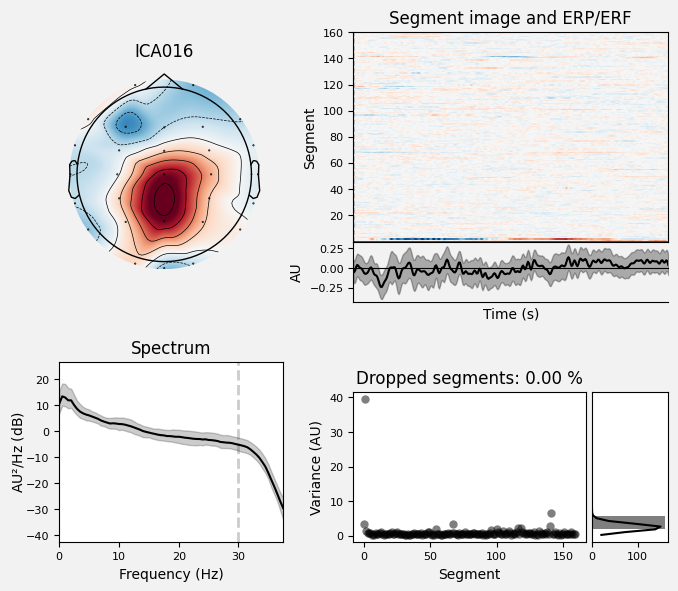

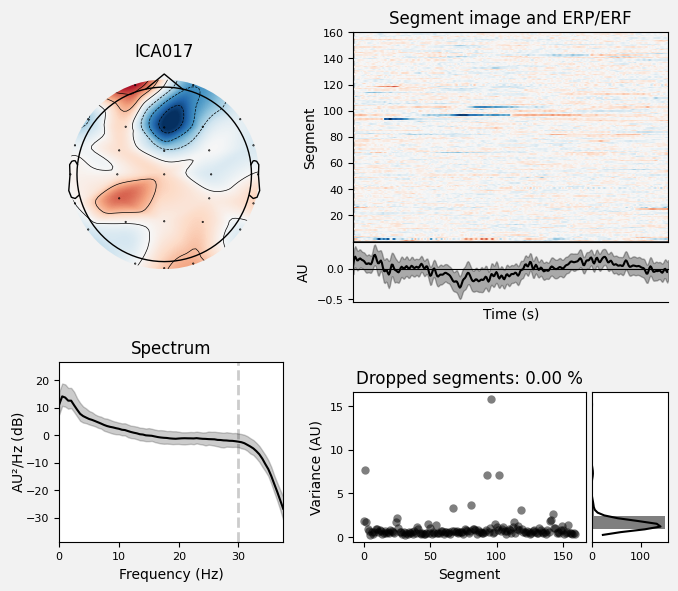

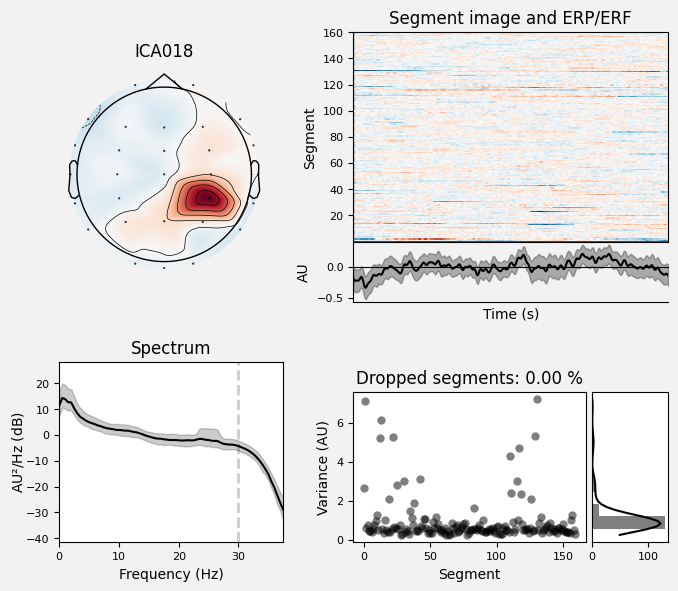

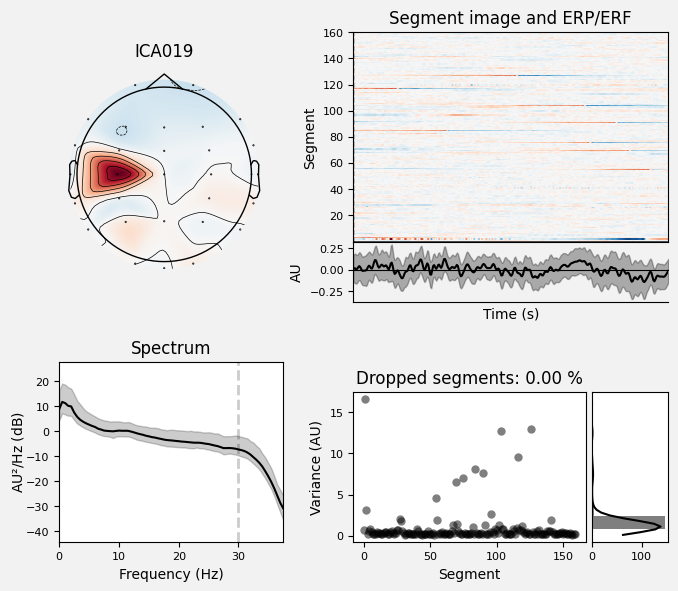

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
ica.plot_properties(reference_raw, picks=[15, 16, 17, 18, 19])

In [ ]:
ica.get_explained_variance_ratio(reference_raw)


{'eeg': 0.9858114316147952}

Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.2

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 sam

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


[0] [array([-0.80827172, -0.38175902, -0.05209956, -0.07286256, -0.17391717,
       -0.09435545, -0.040061  , -0.07948246,  0.05431028,  0.10045153,
        0.01857183,  0.2121047 ,  0.03596121,  0.08087841,  0.11775149,
       -0.00355609, -0.13510796, -0.03344534, -0.08223036, -0.02527744]), array([ 0.78527246,  0.11688897, -0.00481457,  0.0296633 ,  0.0818926 ,
       -0.19557348, -0.02900461, -0.1489388 ,  0.05277581,  0.16464685,
       -0.02091801,  0.03720042,  0.21050725, -0.01179303,  0.18527011,
        0.07624378, -0.16638212,  0.01525808, -0.09053227, -0.01051252])]


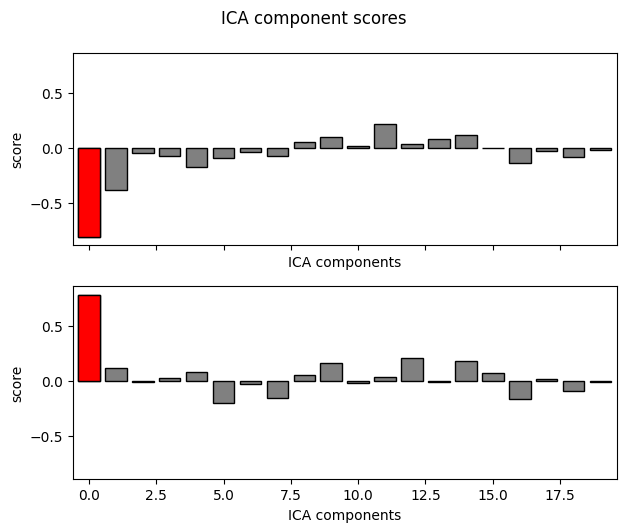

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated


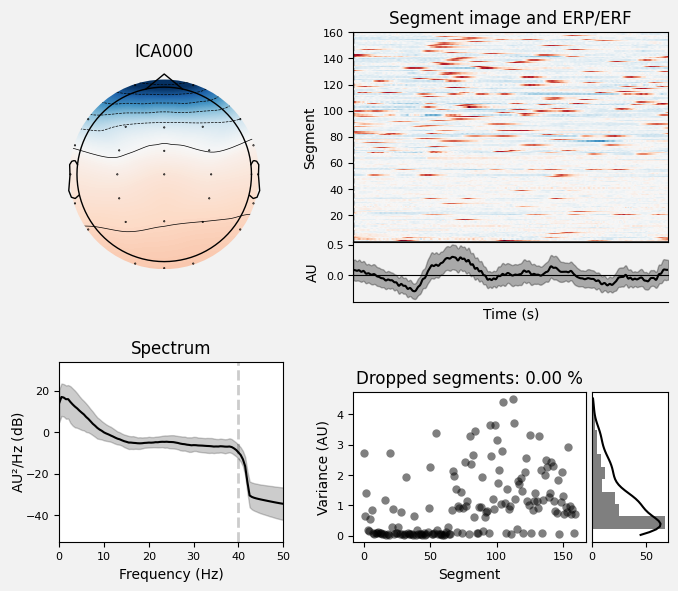

Creating RawArray with float64 data, n_channels=22, n_times=160000
    Range : 0 ... 159999 =      0.000 ...   319.998 secs
Ready.


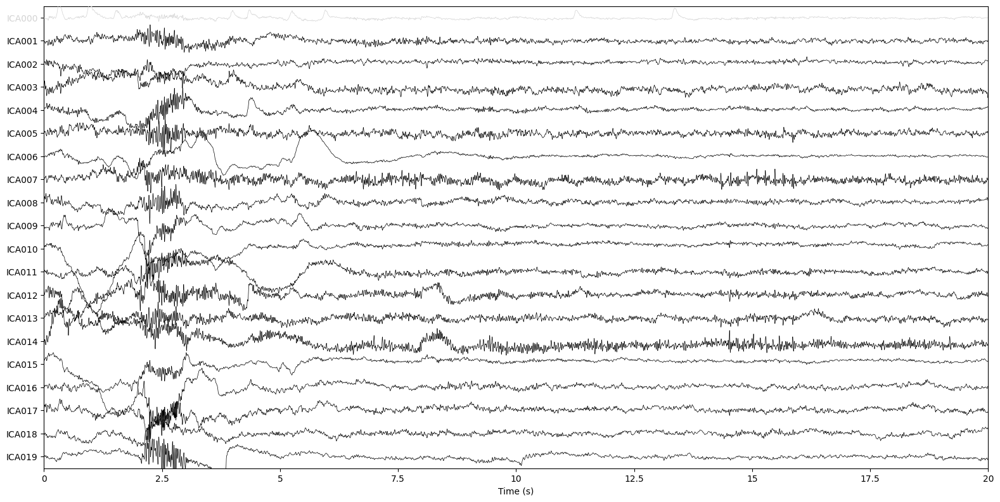

[0]


In [ ]:
ica.exclude = []
# find which ICs match the EOG pattern
eog_indices, eog_scores = ica.find_bads_eog(raw)
print(eog_indices, eog_scores)
ica.exclude = eog_indices

# barplot of ICA component "EOG match" scores
ica.plot_scores(eog_scores)

# plot diagnostics
ica.plot_properties(raw, picks=eog_indices)

# plot ICs applied to raw data, with EOG matches highlighted
ica.plot_sources(raw, show_scrollbars=False)

# plot ICs applied to the averaged EOG epochs, with EOG matches highlighted
# ica.plot_sources(eog_evoked)

print(ica.exclude)

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 4 ICA components
    Projecting back using 29 PCA components


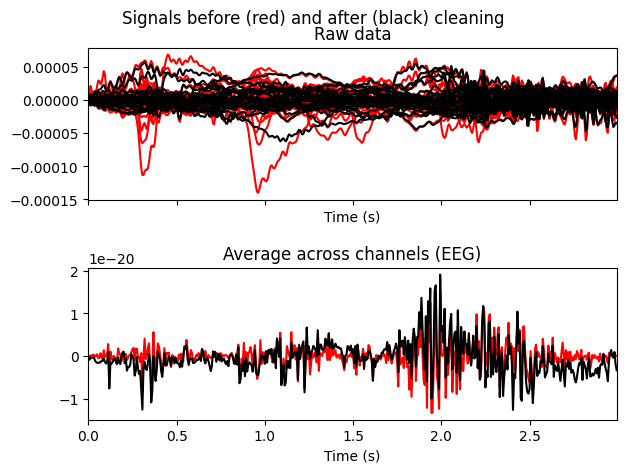

In [ ]:
exclude = [0, 1, 2, 3]
ica.plot_overlay(reference_raw, exclude=exclude)
print()

In [ ]:
ica.exclude = exclude
ica.apply(reference_raw)

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 4 ICA components
    Projecting back using 29 PCA components


<RawEDF | sub-01_task-motor-imagery_eeg.edf, 31 x 51200 (320.0 s), ~12.2 MB, data loaded>

In [ ]:
reference_raw.describe()
print()

<RawEDF | sub-01_task-motor-imagery_eeg.edf, 31 x 51200 (320.0 s), ~12.2 MB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  FP1   EEG   µV       -62.36      -2.90      -0.12       2.71      48.66
 1  FP2   EEG   µV       -54.13      -2.43       0.06       2.51      47.17
 2  Fz    EEG   µV       -19.72      -2.29      -0.04       2.21      38.66
 3  F3    EEG   µV       -34.97      -2.14      -0.01       2.14      32.13
 4  F4    EEG   µV       -17.15      -1.58      -0.00       1.57      16.03
 5  F7    EEG   µV      -106.17      -2.45       0.10       2.57      55.18
 6  F8    EEG   µV       -30.22      -1.74       0.01       1.70      27.06
 7  FCz   EEG   µV       -30.82      -2.11       0.00       2.17      27.04
 8  FC3   EEG   µV       -40.65      -1.66       0.00       1.71      50.28
 9  FC4   EEG   µV       -26.39      -1.32       0.02       1.32      16.08
10  FT7   EEG   µV       -20.22      -1.74       0.01       1.75      24.0

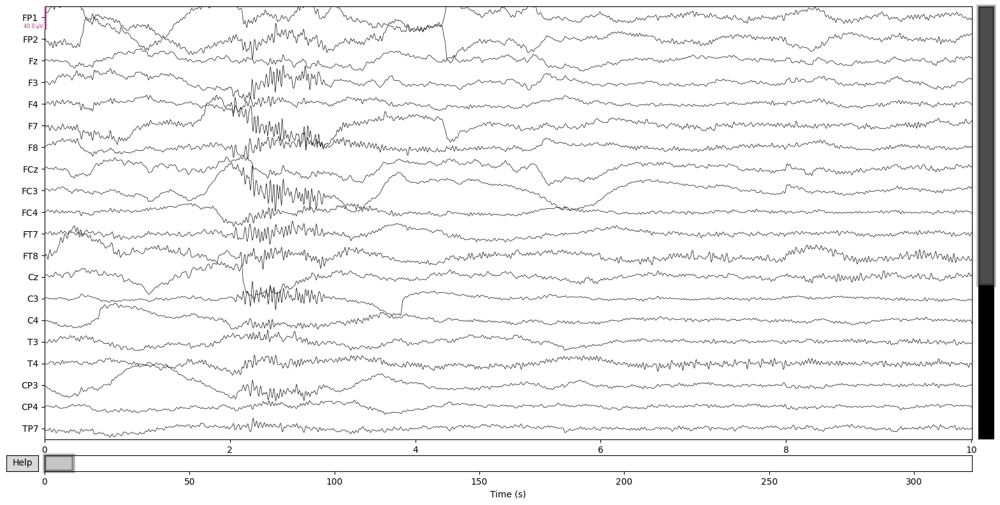

In [ ]:
reference_raw.plot()
print()

{'eeg': 0.9482959263898931}

Using EOG channels: HEOL, HEOR
EOG channel index for this subject is: [29 30]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1600 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 177 significant peaks
Number of EOG events detected: 177
Not setting metadata
177 matching events found
Applying baseline correction (mode: mean)
Using data from preloaded Raw for 177 events and 161 original time points ...
2 bad epochs dropped
Not setting metadata
175 matching events found
No

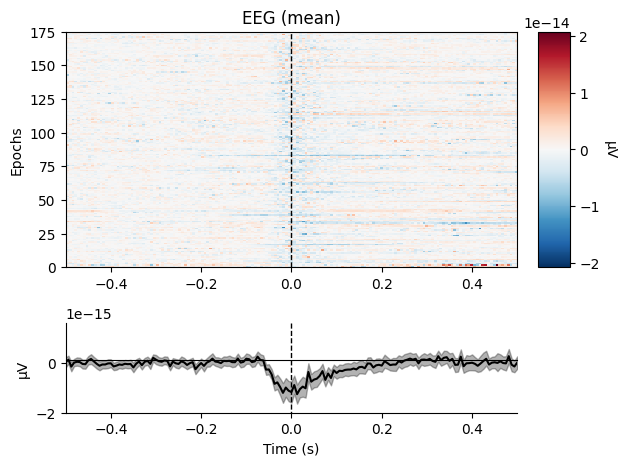

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


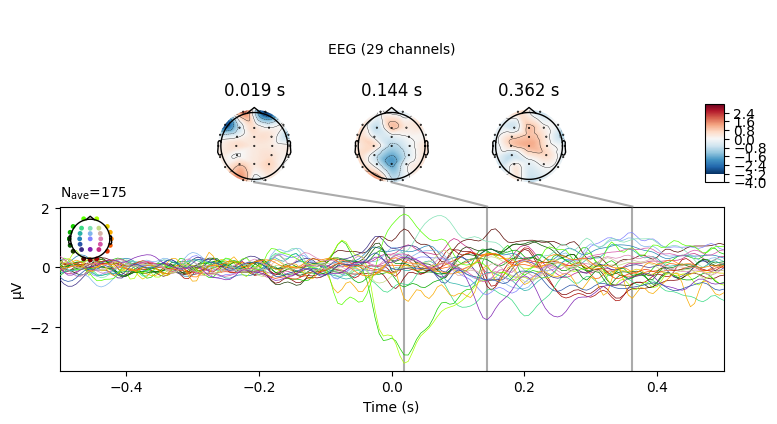

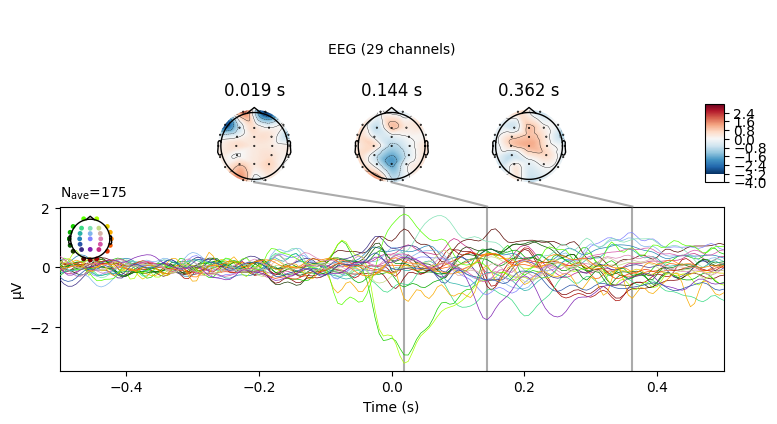

In [ ]:
eog_epochs = mne.preprocessing.create_eog_epochs(reference_raw, baseline=(-0.5, -0.2))
eog_epochs.plot_image(combine="mean")
eog_epochs.average().plot_joint()

# Data Processing

## Base

In [ ]:
mi_related_channels = [
 'F7',
 'F3',
 'Fz',
 'F4',
 'F8',
 'FT7',
 'FC3',
 'FCz',
 'FC4',
 'FT8',
 'T3',
 'T4',
 'TP7',
 'TP8',
 'CP3',
 'CP4',
 'C3',
 'C4',
 'Cz',
]

mi_related_channels = []

In [ ]:
events_file = f'{strokeDataset_path}/task-motor-imagery_events.tsv'

In [ ]:
import pandas as pd

events_data = pd.read_csv(events_file, sep="\t")
# print(events_data)
wanted_trials = events_data[events_data["value"] == 2]

trial_labels = []
for i, w in wanted_trials.iterrows():
  label = w["trial_type"]
  trial_labels.append(label)
  # print(start, end, label)
# print(len(trial_labels))
# print(trial_labels)

trial_type = list(events_data["trial_type"])
value = list(events_data["value"])
event_starts = list(events_data["onset"])
# print(event_starts, trial_type, value)

events = []
for i in range(events_data.shape[0]):
  events.append((event_starts[i]//2+1, 0, trial_type[i] if value[i] == 2 else 3))
  # events.append((event_starts[i] // 1000, 0, trial_type[i] if value[i] == 2 else 3))
print(len(events), *events, sep="\n")

120
(1, 0, 3)
(1001, 0, 1)
(3001, 0, 3)
(4001, 0, 3)
(5001, 0, 2)
(7001, 0, 3)
(8001, 0, 3)
(9001, 0, 1)
(11001, 0, 3)
(12001, 0, 3)
(13001, 0, 2)
(15001, 0, 3)
(16001, 0, 3)
(17001, 0, 1)
(19001, 0, 3)
(20001, 0, 3)
(21001, 0, 2)
(23001, 0, 3)
(24001, 0, 3)
(25001, 0, 1)
(27001, 0, 3)
(28001, 0, 3)
(29001, 0, 2)
(31001, 0, 3)
(32001, 0, 3)
(33001, 0, 1)
(35001, 0, 3)
(36001, 0, 3)
(37001, 0, 2)
(39001, 0, 3)
(40001, 0, 3)
(41001, 0, 1)
(43001, 0, 3)
(44001, 0, 3)
(45001, 0, 2)
(47001, 0, 3)
(48001, 0, 3)
(49001, 0, 1)
(51001, 0, 3)
(52001, 0, 3)
(53001, 0, 2)
(55001, 0, 3)
(56001, 0, 3)
(57001, 0, 1)
(59001, 0, 3)
(60001, 0, 3)
(61001, 0, 2)
(63001, 0, 3)
(64001, 0, 3)
(65001, 0, 1)
(67001, 0, 3)
(68001, 0, 3)
(69001, 0, 2)
(71001, 0, 3)
(72001, 0, 3)
(73001, 0, 1)
(75001, 0, 3)
(76001, 0, 3)
(77001, 0, 2)
(79001, 0, 3)
(80001, 0, 3)
(81001, 0, 1)
(83001, 0, 3)
(84001, 0, 3)
(85001, 0, 2)
(87001, 0, 3)
(88001, 0, 3)
(89001, 0, 1)
(91001, 0, 3)
(92001, 0, 3)
(93001, 0, 2)
(95001, 0, 3)

## EDF

In [ ]:
import numpy as np
from scipy import signal
from mne import filter
import os

os.makedirs(processed_data_path, exist_ok=True)

EDF_DATA_POINTS = 160 * 1000
ORIGINAL_SF = 500
# -> Total duration: 320 seconds

N_TRIALS = 40
# -> Each trial: 8 seconds, 4000 data points
# -> Each trial: 2 second on set (1000), 4 second task (2000), 2 second on set (1000)

SF = 160

TIME_WINDOW_S = 4
SAMPLING_WINDOW = SF * TIME_WINDOW_S

OVERLAPPING_TIME_WINDOW_S = 0
OVERLAPPING_SAMPLES = int(SF * OVERLAPPING_TIME_WINDOW_S)

LEN_TRIALS = 4000

ICA_COMPONENTS = 15

LOW_FREQ = 0.5
HIGH_FREQ = 30

print("Selected channels:", mi_related_channels)

for i in range(1, 51):
  dataset = []
  labels = []

  trial_path = f'{stroke_raw_data_path}/sub-{i:02}/eeg/sub-{i:02}_task-motor-imagery_eeg.edf'

  if mi_related_channels:
    edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', include=mi_related_channels, preload=True)
    edf_data.reorder_channels(mi_related_channels)
  else:
    edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)

  edf_data.set_channel_types({
    'HEOL': 'eog',
    'HEOR': 'eog'
    })

  edf_data.drop_channels(['', 'CPz'])

  # data = edf_data.get_data()
  # print(data.shape)

  # Referencing
  # edf_data.set_eeg_reference('average')

  # Filtering
  edf_data.filter(l_freq=LOW_FREQ, h_freq=HIGH_FREQ)

  # ICA
  ica = mne.preprocessing.ICA(n_components=ICA_COMPONENTS, method='fastica')
  ica.fit(edf_data)

  # Remove EOG artifactis
  ica.exclude = []
  eog_indices, eog_scores = ica.find_bads_eog(edf_data)
  ica.exclude = eog_indices
  ica.exclude = [*ica.exclude, 1, 2, 3]
  ica.apply(edf_data)
  print("ica.exclude:", ica.exclude)

  # Remove EOG
  edf_data.drop_channels(['HEOL', 'HEOR'])

  # Epoch
  print(edf_data.get_data().shape)

  epochs = mne.Epochs(edf_data, events, event_id =[1,2], tmin=0, tmax=4, baseline=(0,0), preload=True)
  print("Epoching:", epochs.get_data().shape)

  # epochs = mne.make_fixed_length_epochs(raw, duration=LEN_TRIALS/SF, preload=True)

  # Resampling
  epochs = epochs.resample(SF, npad='auto')
  print("Resampling:", epochs.get_data().shape)


  data = epochs.get_data()
  print(data.shape)

  # Segmenting
  for k, label in enumerate(trial_labels):
    # Split into smaller windows
    break_points = list(range(0, data[k].shape[1], SAMPLING_WINDOW-OVERLAPPING_SAMPLES))

    for break_point in break_points:
      if break_point+SAMPLING_WINDOW > data[k].shape[1]:
        continue
      one_split = np.take(data[k], range(break_point, break_point+SAMPLING_WINDOW), axis=1)

      # Append each split and corresponding label to data
      dataset.append(one_split)
      labels.append(0 if label == 2 else 1) # convert labels to 0 and 1

  dataset = np.array(dataset)
  labels = np.array(labels)
  print(dataset.shape)
  print(labels.shape)

  # Store data and labels in file

  data_path = f'{processed_data_path}/subject{i:03}.npz'
  np.savez(data_path, data=dataset, labels=labels)
  print(f'---------S{i:03} trials saved to {data_path} ---------')

Selected channels: []


<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Fitting ICA to data using 29 channels (please be patient, this may take a while)
Selecting by number: 15 components
Fitting ICA took 8.9s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Fitting ICA to data using 29 channels (please be patient, this may take a while)
Selecting by number: 15 components
Fitting ICA took 8.5s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 9.9s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 7.5s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 19.2s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 10.3s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)



Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 6.4s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 11.4s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 8.4s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 3.4s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 9.0s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 8.1s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 11.9s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 7.1s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 5.7s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 8.1s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 6.1s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 9.4s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 6.7s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 6.2s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 4.5s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 8.1s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)



FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 4.8s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 9.7s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 10.2s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 5.4s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 7.3s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)



FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 3.7s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 12.7s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 5.5s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 15.9s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 4.9s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 10.0s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 14.3s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 4.5s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 7.8s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 8.1s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 5.1s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)



FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 5.6s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 9.6s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 14.1s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 9.0s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 6.3s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 8.3s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 5.5s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)

Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 4.7s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 15 components
Fitting ICA took 4.0s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 11.1s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper t

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 6.9s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

<ipython-input-55-737b1345b980>:43: RuntimeWarning: Physical range is not defined in following channels:
CPz
  edf_data = mne.io.read_raw_edf(trial_path, verbose='WARNING', preload=True)


Fitting ICA to data using 29 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Selecting by number: 15 components
Fitting ICA took 6.6s.
Using EOG channels: HEOL, HEOR
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper tr

In [ ]:
labels

array([1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0])

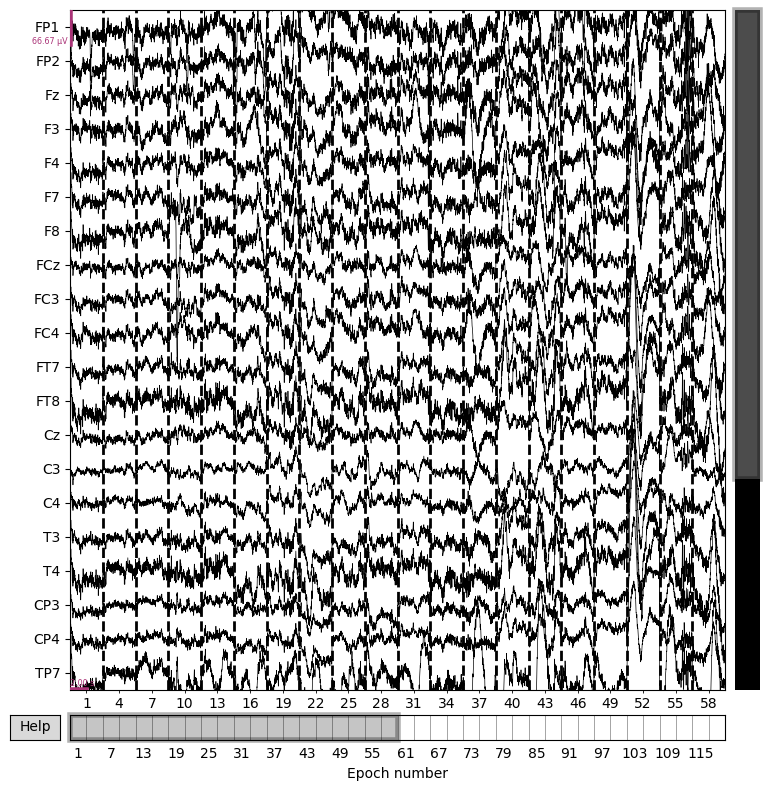

In [ ]:
epochs.copy().plot(scalings=1e-4/3, title='Stroke dataset')
print()

## Matrix

In [ ]:
channels = ['FP1',
 'FP2',
 'Fz',
 'F3',
 'F4',
 'F7',
 'F8',
 'FCz',
 'FC3',
 'FC4',
 'FT7',
 'FT8',
 'Cz',
 'C3',
 'C4',
 'T3',
 'T4',
 'CPz',
 'CP3',
 'CP4',
 'TP7',
 'TP8',
 'Pz',
 'P3',
 'P4',
 'T5',
 'T6',
 'Oz',
 'O1',
 'O2',
 'HEOL',
 'HEOR',
 '']

unwanted_channels = ['CPz', 'HEOL', 'HEOR', '']
wanted_channel_indices = []
for i, c in enumerate(channels):
  if c not in unwanted_channels:
    wanted_channel_indices.append(i)
print(wanted_channel_indices)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]


In [ ]:
import scipy

path = f'{stroke_raw_data_path_mat}/sub-01/sub-01_task-motor-imagery_eeg.mat'
mat = scipy.io.loadmat(path)

data = mat['eeg'][0][0][0]
labels = mat['eeg'][0][0][1]

# Select event
data = data[:, :, 1000:3000]

# Select channels
data = data[:, wanted_channel_indices, :]

data = scipy.signal.resample(data, data.shape[2]//500*160, axis=2)
data.shape

(40, 29, 640)

In [ ]:
import numpy as np
from scipy import signal
from mne import filter
import os

os.makedirs(processed_data_path, exist_ok=True)

EDF_DATA_POINTS = 160 * 1000
ORIGINAL_SF = 500
# -> Total duration: 320 seconds

N_TRIALS = 40
# -> Each trial: 8 seconds, 4000 data points
# -> Each trial: 2 second on set (1000), 4 second task (2000), 2 second on set (1000)

SF = 160

TIME_WINDOW_S = 4
SAMPLING_WINDOW = SF * TIME_WINDOW_S

OVERLAPPING_TIME_WINDOW_S = 0
OVERLAPPING_SAMPLES = int(SF * OVERLAPPING_TIME_WINDOW_S)

LEN_TRIALS = 4000

ICA_COMPONENTS = 15

LOW_FREQ = 0.5
HIGH_FREQ = 30

print("Selected channels:", mi_related_channels)

for i in range(1, 51):
  dataset = []
  labels = []

  path = f'{stroke_raw_data_path_mat}/sub-{i:02}/sub-{i:02}_task-motor-imagery_eeg.mat'

  mat = scipy.io.loadmat(path)

  data = mat['eeg'][0][0][0]
  labels = mat['eeg'][0][0][1]

  # Select event
  data = data[:, :, 1000:3000]

  # Select channels
  data = data[:, wanted_channel_indices, :]

  data = scipy.signal.resample(data, data.shape[2]//500*160, axis=2)
  print(data.shape)

  labels = labels.reshape(labels.shape[0])
  labels = (labels == 1).astype(np.int)
  print(labels.shape)

  data_path = f'{processed_data_path_mat}/subject{i:03}.npz'
  np.savez(data_path, data=data, labels=labels)
  print(f'---------S{i:03} trials saved to {data_path} ---------')

Selected channels: []
(40, 29, 640)
---------S001 trials saved to /content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/custom_mat/subject001.npz ---------


<ipython-input-70-2b0e4334c89e>:54: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  labels = (labels == 1).astype(np.int)


(40, 29, 640)
---------S002 trials saved to /content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/custom_mat/subject002.npz ---------
(40, 29, 640)
---------S003 trials saved to /content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/custom_mat/subject003.npz ---------
(40, 29, 640)
---------S004 trials saved to /content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/custom_mat/subject004.npz ---------
(40, 29, 640)
---------S005 trials saved to /content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/custom_mat/subject005.npz ---------
(40, 29, 640)
---------S006 trials saved to /content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/custom_mat/subject006.npz ---------
(40, 29, 640)
---------S007 trials saved to /content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/custom_mat/subject007.npz ---------
(40, 29, 640)
---------S008 trials saved to /content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/custom_mat/subject008.npz ---------
(40, 29, 640)
---------S009 trials saved to /content/drive/MyDrive/NMA2023_DL/Stroke_Dataset/cust

<ipython-input-69-4240a6d02678>:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  a.astype(np.int)


array([1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0])

# Training

In [ ]:
import os
import pandas as pd
import torch
from torch.utils.data import Dataset
import numpy as np

class EEGDataset(Dataset):
    def __init__(self, data_folder_path: str,
                 subjects: list,
                 shuffle: bool = True,
                 trial_numbers: list | None = None,
                 four_dim: bool = True):
      """
      `data_folder_path` should have following structure:
        - subject001.npz
        - subject001.npz
        ...

      Each npz file contains both "data" and "labels" for one subject.
      """

      print("----")
      print(f"Creating dataset for {len(subjects)} subjects...")
      if trial_numbers:
          print(f"Creating dataset for {len(trial_numbers)} trials...")

      data_list = []
      labels_list = []

      for i in subjects:
        data_and_labels = np.load(f"{data_folder_path}/subject{i:03}.npz")

        data = data_and_labels['data']
        if four_dim:
          data = data.reshape((data.shape[0], 1, *data.shape[1:])) # N C W -> N 1 C W

        labels = data_and_labels['labels']

        if trial_numbers:
          if four_dim:
            data_list.append(data[trial_numbers, :, :, :])
          else:
            data_list.append(data[trial_numbers, :, :])
          labels_list.append(labels[trial_numbers])
        else:
          data_list.append(data)
          labels_list.append(labels)

      self.data = torch.tensor(np.concatenate(data_list).astype(np.float32))
      self.labels = torch.tensor(np.concatenate(labels_list).astype(np.long))

      if shuffle:
        idx = torch.randperm(self.data.shape[0])
        self.data = self.data[idx]
        self.labels = self.labels[idx]

      print("Dataset created:")
      print("Data shape:", self.data.shape)
      print("Labels shape:", self.labels.shape)
      print("----")



    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]


In [ ]:

TRIAL_SPLITTING = True
SUBJECT_SPLITTING = not TRIAL_SPLITTING

from torch.utils.data import random_split

NUMBER_OF_SUBJECTS = len([name for name in os.listdir(processed_data_path) if name.endswith("npz")])
NUMBER_OF_SUBJECTS = 3
print("NUMBER_OF_SUBJECTS:", NUMBER_OF_SUBJECTS)
subjects = range(1, NUMBER_OF_SUBJECTS+1)

TRIAL_NUMBERS = 40
print("NUMBER_OF_TRIALS:", TRIAL_NUMBERS)
trials = range(0, TRIAL_NUMBERS)

split_size = [0.6, 0.2, 0.2]

train_subjects = subjects
val_subjects = subjects
test_subjects = subjects


train_trials = trials
val_trials = trials
test_trials = trials

if SUBJECT_SPLITTING:
  splits = random_split(subjects, split_size)

  train_subjects = list(splits[0])
  val_subjects = list(splits[1])
  test_subjects = list(splits[2])

if TRIAL_SPLITTING:
  splits = random_split(trials, split_size)

  train_trials = list(splits[0])
  val_trials = list(splits[1])
  test_trials = list(splits[2])
  print(train_trials)
  print(val_trials)
  print(test_trials)


NUMBER_OF_SUBJECTS: 3
NUMBER_OF_TRIALS: 40
[7, 16, 3, 6, 32, 10, 38, 14, 29, 1, 9, 34, 27, 25, 21, 39, 2, 31, 19, 15, 12, 23, 4, 17]
[20, 28, 37, 0, 22, 11, 33, 5]
[30, 18, 24, 35, 8, 26, 13, 36]


In [ ]:
DATA_PATH = processed_data_path
# DATA_PATH = processed_data_path_mat

train_data = EEGDataset(DATA_PATH, train_subjects, shuffle=True, trial_numbers=train_trials)
val_data = EEGDataset(DATA_PATH, val_subjects, shuffle=True, trial_numbers=val_trials)
test_data = EEGDataset(DATA_PATH, test_subjects, shuffle=True, trial_numbers=test_trials)

print(train_data.labels)
print(val_data.labels)
print(test_data.labels)

----
Creating dataset for 3 subjects...
Creating dataset for 24 trials...
Dataset created:
Data shape: torch.Size([72, 1, 29, 640])
Labels shape: torch.Size([72])
----
----
Creating dataset for 3 subjects...
Creating dataset for 8 trials...
Dataset created:
Data shape: torch.Size([24, 1, 29, 640])
Labels shape: torch.Size([24])
----
----
Creating dataset for 3 subjects...
Creating dataset for 8 trials...
Dataset created:
Data shape: torch.Size([24, 1, 29, 640])
Labels shape: torch.Size([24])
----
tensor([1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1,
        1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0,
        0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0])
tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1])
tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1])


<ipython-input-57-5bcb08f9875d>:50: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  self.labels = torch.tensor(np.concatenate(labels_list).astype(np.long))


In [ ]:
from torch.utils.data import DataLoader

BATCH_SIZE = 16

train_loader = DataLoader(train_data, batch_size=BATCH_SIZE)
val_loader = DataLoader(val_data, batch_size=BATCH_SIZE)
test_loader = DataLoader(test_data, batch_size=BATCH_SIZE)

In [ ]:
from torcheeg import models

NUM_ELECTRODES = 29
NUM_CLASSES = 2
DATA_POINTS = 640

model = models.EEGNet(
      chunk_size=DATA_POINTS, # number of time points
      num_electrodes=NUM_ELECTRODES, # number of channels
      dropout=0,
      kernel_1=32,
      kernel_2=32,
      F1=8, # number of temporal filters
      F2=8, # number of pointwise filters
      D=8, # depth multiplier (number of spatial filters)
      num_classes=NUM_CLASSES
    )

In [ ]:
from torcheeg import trainers

from io import StringIO
import sys

class Capturing(list):
    def __enter__(self):
        self._stdout = sys.stdout
        sys.stdout = self._stringio = StringIO()
        return self
    def __exit__(self, *args):
        self.extend(self._stringio.getvalue().splitlines())
        del self._stringio    # free up some memory
        sys.stdout = self._stdout

lr = 0.0001
n_epochs = 2

trainer = trainers.ClassificationTrainer(model, NUM_CLASSES, lr=lr)
# import io
# with io.capture_output():
trainer.fit(train_loader, val_loader, num_epochs=n_epochs)

# trainer = trainers.ClassifierTrainer(model, NUM_CLASSES, lr=lr)
# trainer.fit(train_loader, val_loader, max_epochs=n_epochs)
